##Clonar repositorio de Yolo V5 e importar librerías

In [ ]:
#Clonar Yolo
!git clone https://github.com/ultralytics/yolov5  # clonar repositorio
%cd yolov5
%pip install -qr requirements.txt # instalar las dependencias
%pip install -q roboflow

# Importar librerías
import torch
import os
from IPython.display import Image, clear_output, display  # para mostrar las imágenes

# Mostrar versión de Pytorch y analizar si se está usando CPU o GPU
print(f"Configuración completa. Usando torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")

fatal: destination path 'yolov5' already exists and is not an empty directory.
/content/yolov5
Configuración completa. Usando torch 1.12.1+cu113 (Tesla T4)


##Importar Dataset de Roboflow

In [ ]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="CnwEJ00vYE1V6xWpyJOL")
project = rf.workspace("mumbai-university-tb2az").project("printer-spaghetti")
dataset = project.version(4).download("yolov5")

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to printer-spaghetti--4 in yolov5pytorch:: 100%|██████████| 18968/18968 [00:03<00:00, 5402.29it/s]


##Entrenar modelo YOLOv5

In [ ]:
# Entrenar el modelo especificando un tamaño de imagen de 640x640 y la arquitectura YOLOv5x (la más grande)
!python train.py --img 640 --batch 16 --epochs 20 --data {dataset.location}/data.yaml --weights yolov5x.pt --cache

train: weights=yolov5x.pt, cfg=, data=/content/yolov5/printer-spaghetti--4/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=20, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v7.0-23-g5dc1ce4 Python-3.8.15 torch-1.12.1+cu113 CUDA:0 (Tesla T4, 15110MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0, hs

##Evaluar el Performance con Tensorboard

In [ ]:
# Start tensorboard
# Desplegar después de que se ha comenzado el entrenamiento
# logs guardados en la carpeta "runs"
%load_ext tensorboard
%tensorboard --logdir runs

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 3400), started 0:16:34 ago. (Use '!kill 3400' to kill it.)

<IPython.core.display.Javascript object>

##Evaluar el Modelo

In [ ]:
!python detect.py --weights runs/train/exp/weights/best.pt --img 640 --conf 0.1 --source {dataset.location}/test/images

detect: weights=['runs/train/exp/weights/best.pt'], source=/content/yolov5/printer-spaghetti--4/test/images, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-23-g5dc1ce4 Python-3.8.15 torch-1.12.1+cu113 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
Model summary: 322 layers, 86254162 parameters, 0 gradients, 204.0 GFLOPs
image 1/78 /content/yolov5/printer-spaghetti--4/test/images/065a0756d376bc93e5eaf1faaaf6a649_jpg.rf.9146b56cfe62a5efbb780140c090adc6.jpg: 640x640 2 Spaghettis, 88.0ms
image 2/78 /content/yolov5/printer-spaghetti--4/test/images/116-3x2_troubleshooting_jpg.rf.d9750ed459e22e972c87d10d6121ee93.jpg: 640x640 6 Spaghettis,

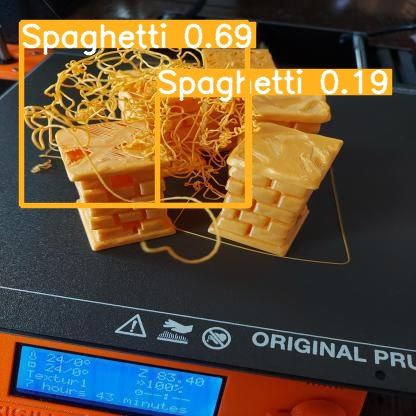

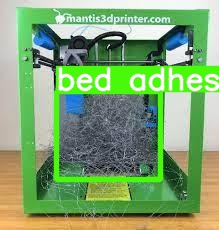

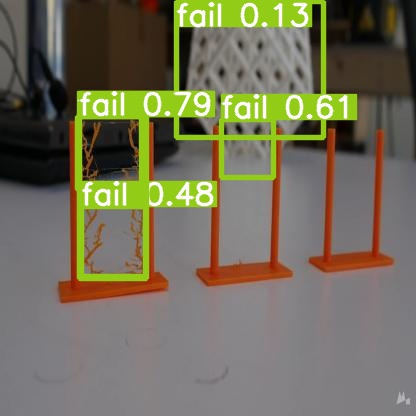

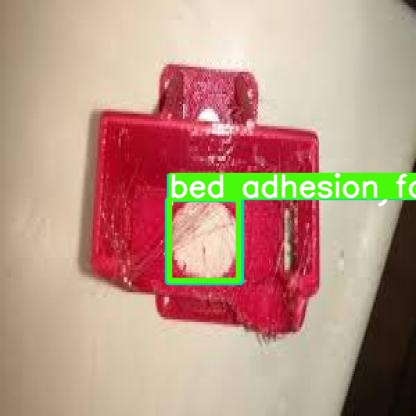

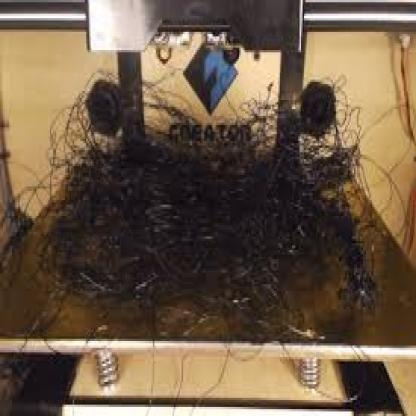

...

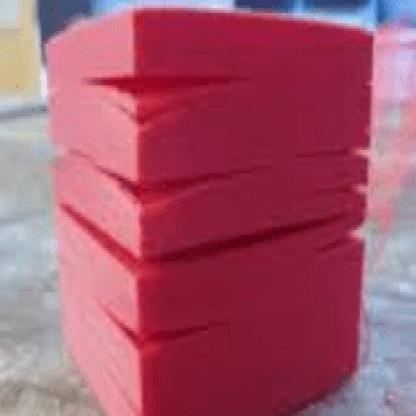

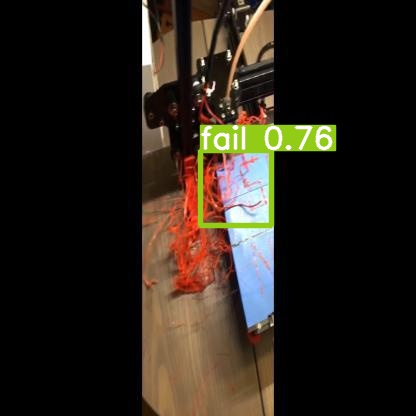

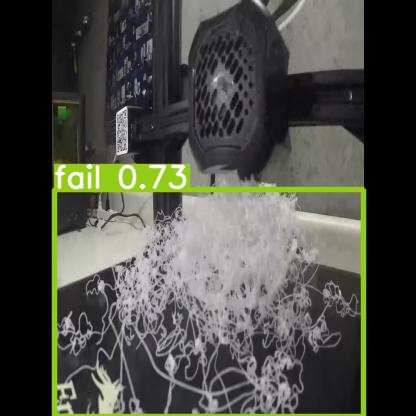

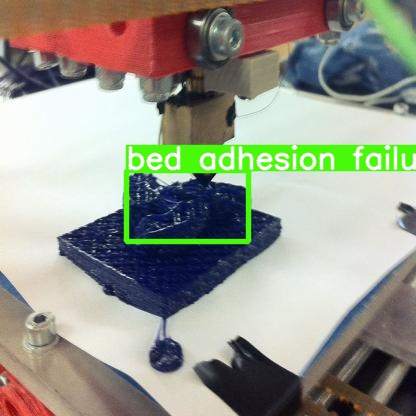

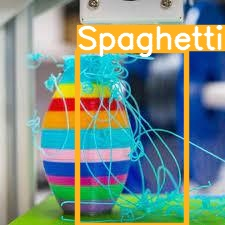

In [ ]:
#Mostrar las detecciones

import glob
from IPython.display import display

for imageName in glob.glob('/content/yolov5/runs/detect/exp/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

Descargar el Modelo

In [ ]:
# #Exportar los pesos del modelo
# from google.colab import files
# files.download('./runs/train/exp/weights/best.pt')

##Pruebas de Detección

Detección Video 1

In [ ]:
!python detect.py --weights runs/train/exp/weights/best.pt --img 640 --conf 0.1 --source 'https://youtu.be/JGpCGOMgk5g'

Se truncaron las últimas líneas 5000 del resultado de transmisión.
0: 384x640 1 fail, 34.7ms
0: 384x640 1 fail, 34.7ms
0: 384x640 1 fail, 35.9ms
0: 384x640 1 fail, 38.3ms
0: 384x640 1 fail, 35.4ms
0: 384x640 1 fail, 35.3ms
0: 384x640 1 fail, 37.5ms
0: 384x640 1 fail, 34.6ms
0: 384x640 1 fail, 35.6ms
0: 384x640 1 fail, 38.1ms
0: 384x640 1 fail, 35.4ms
0: 384x640 1 fail, 35.8ms
0: 384x640 1 fail, 36.9ms
0: 384x640 1 fail, 34.2ms
0: 384x640 1 fail, 35.5ms
0: 384x640 1 fail, 38.3ms
0: 384x640 1 fail, 36.0ms
0: 384x640 1 fail, 35.3ms
0: 384x640 1 fail, 36.1ms
0: 384x640 1 fail, 34.4ms
0: 384x640 1 fail, 35.4ms
0: 384x640 1 fail, 37.8ms
0: 384x640 1 fail, 36.1ms
0: 384x640 1 fail, 35.6ms
0: 384x640 1 fail, 36.1ms
0: 384x640 1 fail, 34.1ms
0: 384x640 1 fail, 35.2ms
0: 384x640 1 fail, 37.3ms
0: 384x640 1 fail, 37.0ms
0: 384x640 1 fail, 35.3ms
0: 384x640 1 fail, 35.9ms
0: 384x640 1 fail, 37.4ms
0: 384x640 1 fail, 34.3ms
0: 384x640 1 fail, 35.3ms
0: 384x640 1 fail, 37.8ms
0: 384x640 1 fail, 34.7

Detección Video 2

In [ ]:
!python detect.py --weights runs/train/exp/weights/best.pt --img 640 --conf 0.1 --source 'https://youtu.be/mrFqChq4uKs'

Se truncaron las últimas líneas 5000 del resultado de transmisión.
0: 384x640 (no detections), 37.4ms
0: 384x640 (no detections), 37.0ms
0: 384x640 (no detections), 34.7ms
0: 384x640 (no detections), 35.9ms
0: 384x640 (no detections), 38.5ms
0: 384x640 (no detections), 37.3ms
0: 384x640 (no detections), 34.9ms
0: 384x640 (no detections), 35.9ms
0: 384x640 (no detections), 38.5ms
0: 384x640 (no detections), 37.7ms
0: 384x640 (no detections), 36.1ms
0: 384x640 (no detections), 35.6ms
0: 384x640 (no detections), 36.0ms
0: 384x640 (no detections), 38.1ms
0: 384x640 (no detections), 37.9ms
0: 384x640 (no detections), 34.7ms
0: 384x640 (no detections), 35.8ms
0: 384x640 (no detections), 37.7ms
0: 384x640 (no detections), 35.8ms
0: 384x640 (no detections), 35.3ms
0: 384x640 (no detections), 35.1ms
0: 384x640 (no detections), 36.5ms
0: 384x640 (no detections), 35.6ms
0: 384x640 (no detections), 35.8ms
0: 384x640 (no detections), 35.7ms
0: 384x640 (no detections), 38.4ms
0: 384x640 (no detectio

Descargar videos de detección

In [ ]:
from google.colab import files
files.download('./runs/detect/exp5/JGpCGOMgk5g.mp4')
files.download('./runs/detect/exp6/mrFqChq4uKs.mp4')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Detección Video 3

In [ ]:
!python detect.py --weights runs/train/exp/weights/best.pt --img 640 --conf 0.1 --source 'https://youtu.be/q3_5lucoa4M'

detect: weights=['runs/train/exp/weights/best.pt'], source=https://youtu.be/q3_5lucoa4M, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-23-g5dc1ce4 Python-3.8.15 torch-1.12.1+cu113 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
Model summary: 322 layers, 86254162 parameters, 0 gradients, 204.0 GFLOPs
WARNING ⚠️ Environment does not support cv2.imshow() or PIL Image.show()

1/1: https://youtu.be/q3_5lucoa4M...  Success (5067 frames 1280x720 at 30.00 FPS)

0: 384x640 1 Spaghetti, 993.3ms
0: 384x640 1 Spaghetti, 30.2ms
0: 384x640 1 Spaghetti, 31.1ms
0: 384x640 1 Spaghetti, 32.0ms
0: 384x640 1 Spaghetti, 31.6ms
0: 384x640 1 Spaghetti, 

In [ ]:
files.download('./runs/detect/exp7/q3_5lucoa4M.mp4')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>